# Import Statements and GPU Logic

In [1]:
import torch
from torch import nn
from tqdm.auto import tqdm
from torchvision import transforms
from torchvision.datasets import MNIST # Training dataset
from torchvision.utils import make_grid
from torch.utils.data import DataLoader
import matplotlib.pyplot as plt

dev = ""

if torch.cuda.is_available():  
  dev = "cuda:0" 
else:  
  dev = "cpu"  
device = torch.device(dev)

# Visualize Images

In [2]:
def show_tensor_images(image_tensor, num_images=25, size=(1, 28, 28)):
    image_unflat = image_tensor.detach().cpu().view(-1, *size)
    image_grid = make_grid(image_unflat[:num_images], nrow=5)
    plt.imshow(image_grid.permute(1, 2, 0).squeeze())
    plt.show()

# Generator

In [3]:
def get_generator_block(input_dim, output_dim):
        return nn.Sequential(
            nn.Linear(input_dim, output_dim),
            nn.BatchNorm1d(output_dim),
            nn.ReLU(inplace=True),
        )
    
class Generator(nn.Module):
    '''
    Generator Class
    Values:
        z_dim: the dimension of the noise vector, a scalar
        im_dim: the dimension of the images, fitted for the dataset used, a scalar
          (MNIST images are 28 x 28 = 784 so that is your default)
        hidden_dim: the inner dimension, a scalar
    '''

    def __init__(self, z_dim=1000, im_dim=784, hidden_dim=128):
        super(Generator, self).__init__()
        # Build the neural network
        self.gen = nn.Sequential(
            get_generator_block(z_dim, 1200),
            get_generator_block(1200, 100),
            get_generator_block(100, 900),
            nn.Linear(900, im_dim),
            nn.Sigmoid()
        )
    def forward(self, noise):
        return self.gen(noise)
    
def get_noise(n_samples, z_dim):
     return torch.randn(n_samples, z_dim).to(device)

def get_gen_loss(gen, disc, criterion, num_images, z_dim):
    latent_vectors = get_noise(num_images, z_dim)
    fake_images = gen(latent_vectors)
    disc.eval()
    pred = disc(fake_images)
    disc.train()
    gen_loss = criterion(pred, torch.ones_like(pred))
    return gen_loss

# Discriminator

In [4]:
def get_discriminator_block(input_dim, output_dim):
        return nn.Sequential(
            nn.Linear(input_dim, output_dim),
            nn.LeakyReLU(0.1)
        )

class Discriminator(nn.Module):
    def __init__(self, im_dim=784, hidden_dim=128):
        super(Discriminator, self).__init__()
        self.disc = nn.Sequential(
            get_discriminator_block(im_dim, 600),
            get_discriminator_block(600, 300),
            get_discriminator_block(300, 100),
            nn.Linear(100, 1),
            nn.Sigmoid()
        )

    def forward(self, image):
        return self.disc(image)
    
def get_disc_loss(gen, disc, criterion, real, num_images, z_dim):
    latent_vectors = get_noise(num_images, z_dim)
    gen.eval()
    fake_images = gen(latent_vectors)
    gen.train()
    pred = disc(fake_images.detach())
    
    ground_truth = torch.zeros_like(pred) 
    loss_fake = criterion(pred, ground_truth)
    
    pred = disc(real)
    ground_truth = torch.ones_like(pred)
    loss_real = criterion(pred, ground_truth)
    
    disc_loss = (loss_fake + loss_real) / 2
    return disc_loss

In [5]:
def performance_stats(gen, disc, b_size, z_dim, batch = None):
    tp = 0 #true positive
    fp = 0 #false positive
    tn = 0 #true negative
    fn = 0 #false negative

    with torch.no_grad():
        y_hat_fake = torch.Tensor([0])
        y_hat_real = torch.Tensor([0])

        latent_vectors = get_noise(b_size, z_dim)
        gen.eval()
        fake_features = gen(latent_vectors)
        gen.train()
        disc.eval()
        y_hat_fake = torch.round(disc(fake_features))
        y_hat_real = torch.round(disc(batch))
        disc.train()
         
        fpR = torch.mean(y_hat_fake)
        recall = torch.mean(y_hat_real)
        #print(f'Classification Accuracy: {class_acc:.2f}'
        #print(f'Recall: {recall:.2f}') #What percent of the true positives were identified
        return recall, fpR

In [6]:
criterion = nn.BCELoss()
n_epochs = 100
z_dim = 1400
batch_size = 128
lr = 0.00001

# Load MNIST dataset as tensors
dataloader = DataLoader(
    MNIST('.', download=True, transform=transforms.ToTensor()),
    batch_size=batch_size,
    shuffle=True)

In [7]:
gen = Generator(z_dim).to(device)
gen_opt = torch.optim.Adam(gen.parameters(), lr=lr)
disc = Discriminator().to(device) 
disc_opt = torch.optim.Adam(disc.parameters(), lr=lr)

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 1


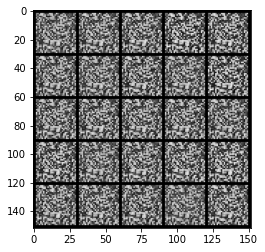

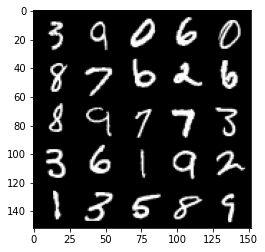

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 2


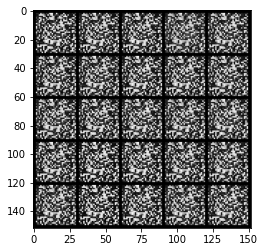

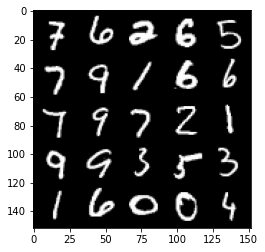

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 3


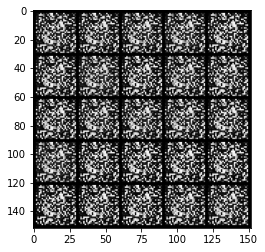

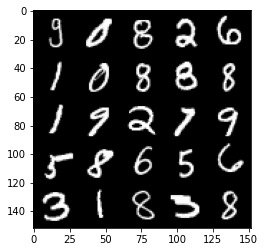

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 4


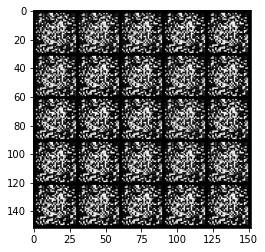

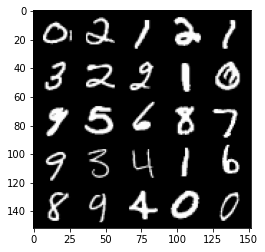

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 5


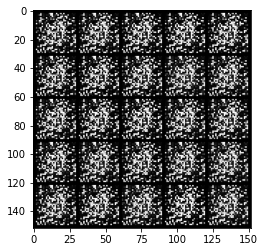

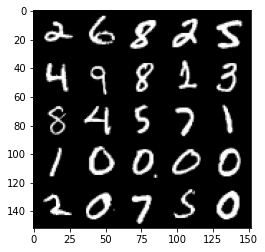

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 6


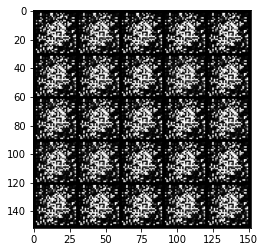

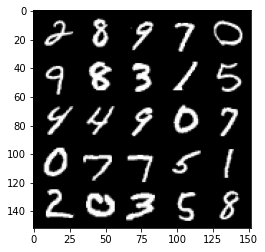

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 7


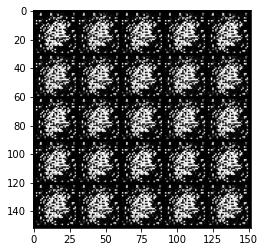

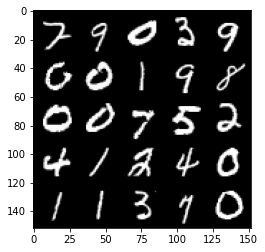

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 8


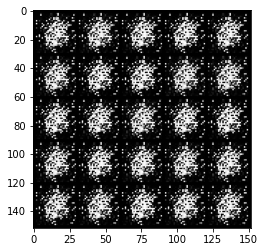

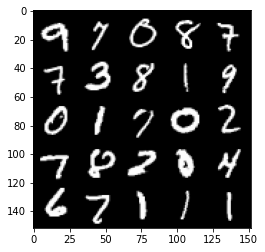

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 9


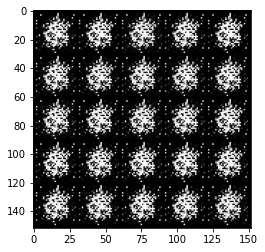

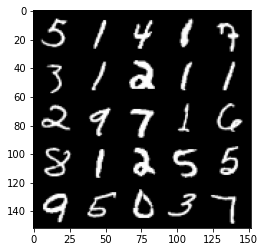

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 10


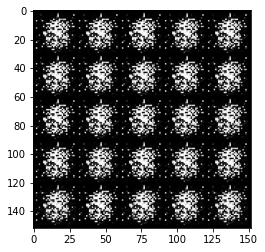

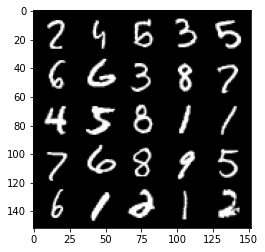

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 11


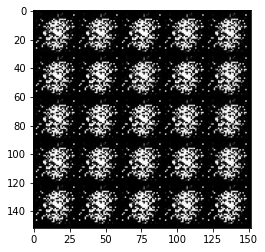

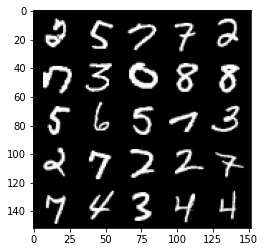

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 12


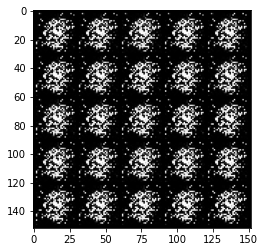

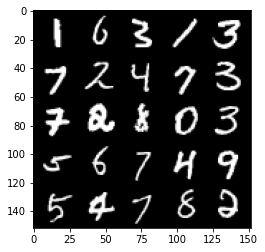

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 13


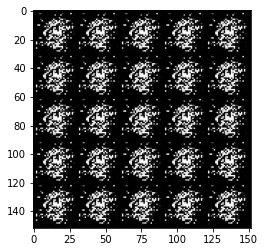

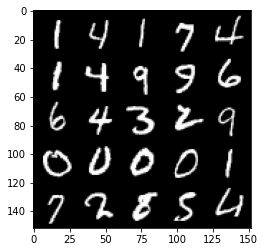

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 14


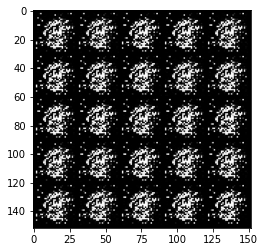

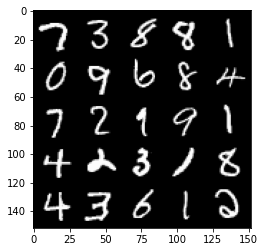

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 15


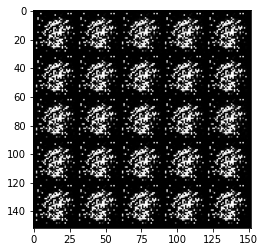

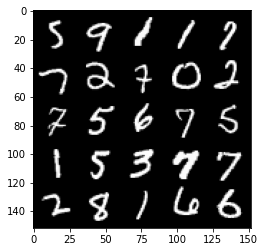

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 16


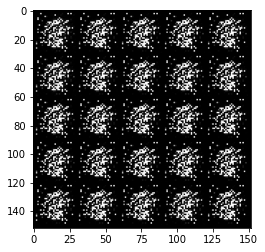

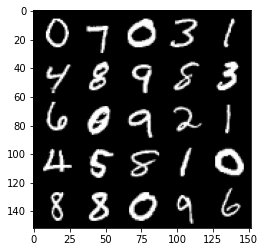

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 17


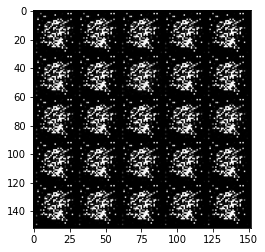

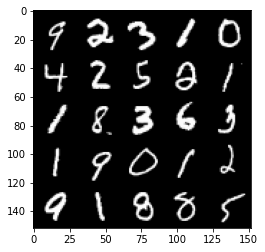

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 18


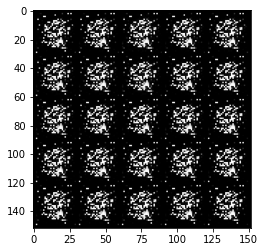

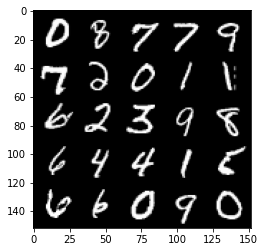

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 19


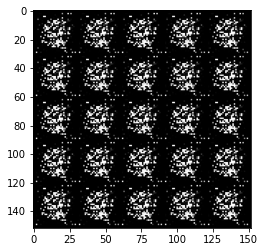

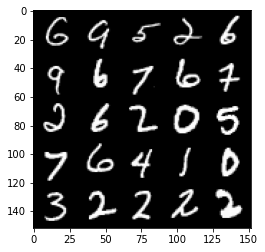

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 20


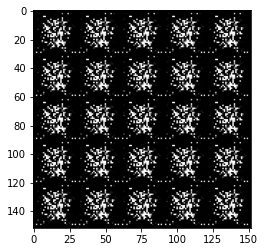

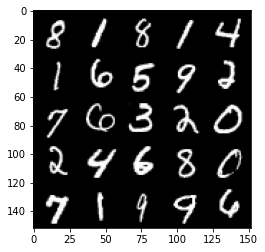

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 21


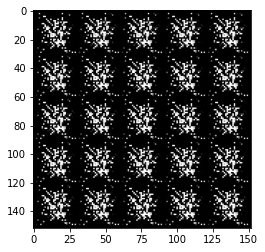

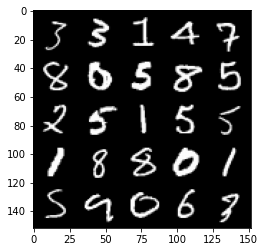

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 22


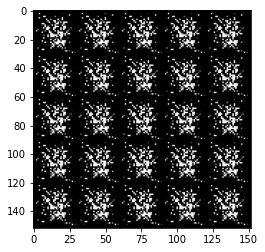

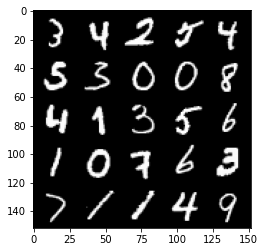

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 23


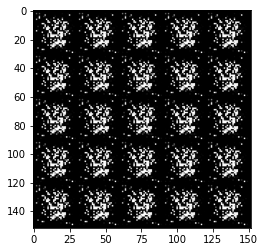

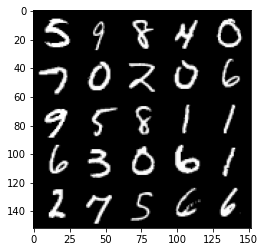

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 24


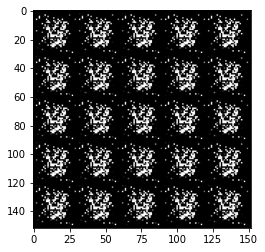

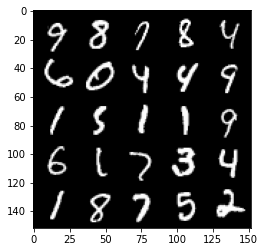

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 25


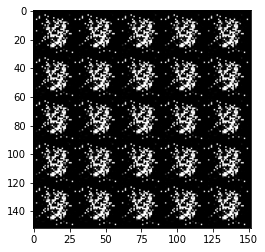

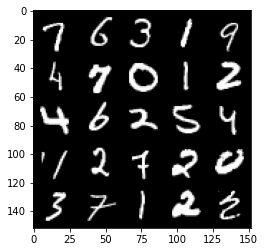

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 26


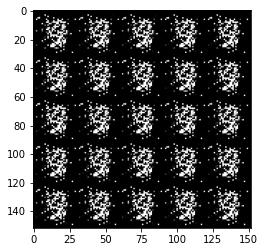

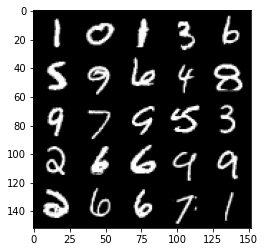

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 27


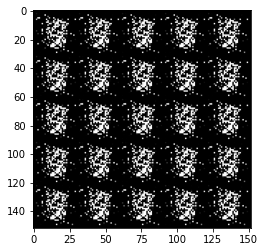

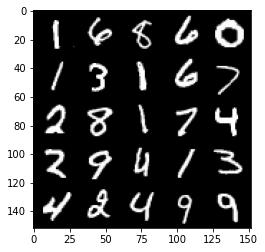

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 28


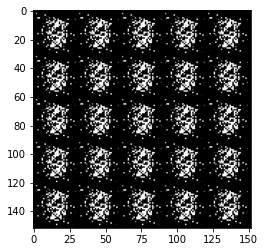

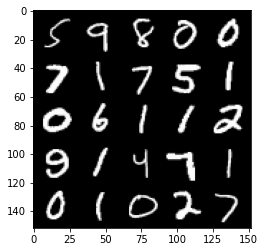

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 29


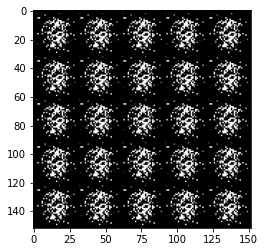

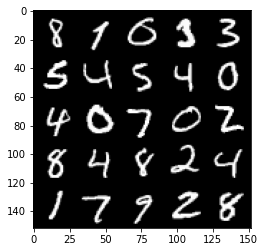

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 30


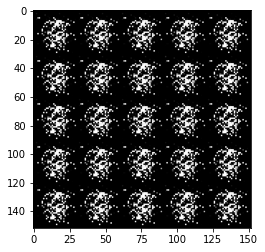

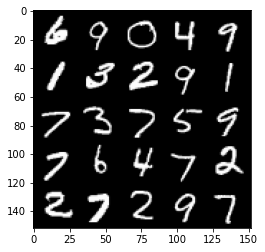

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 31


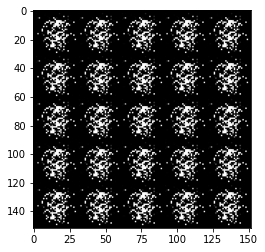

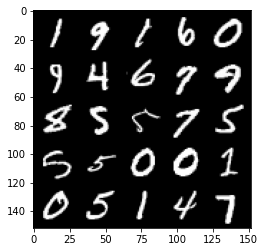

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 32


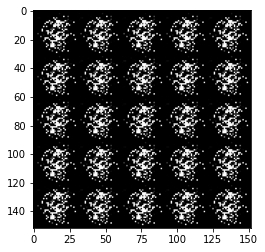

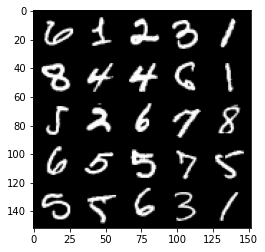

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 33


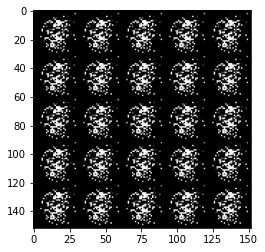

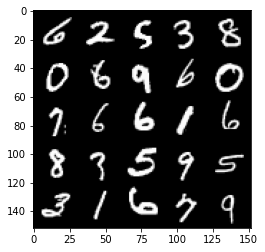

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 34


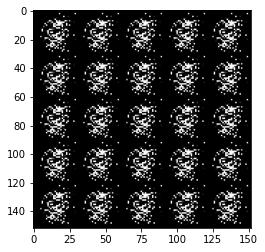

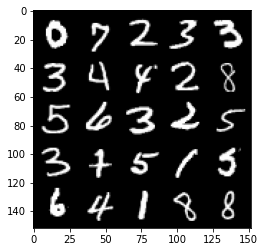

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 35


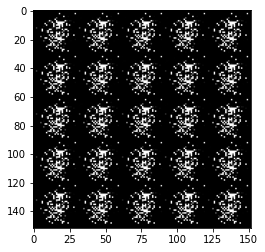

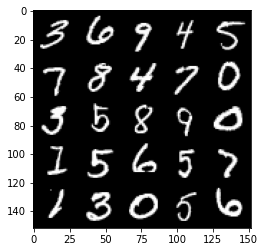

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 36


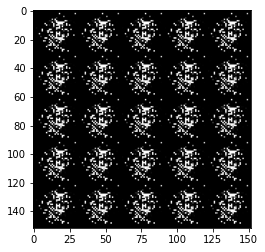

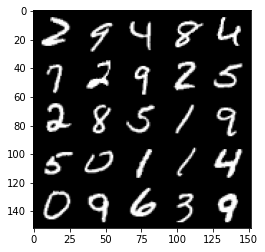

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 37


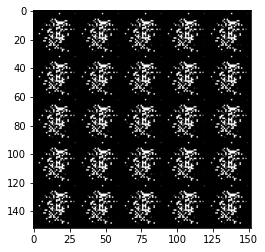

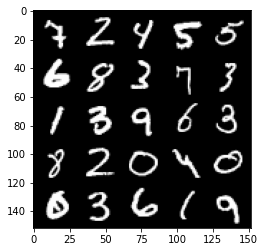

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 38


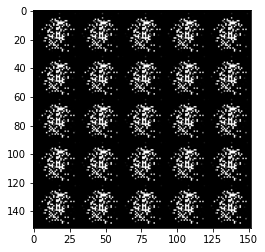

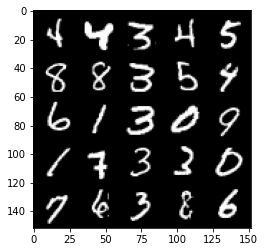

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 39


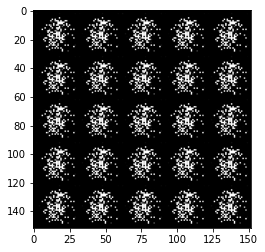

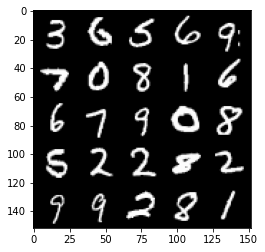

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 40


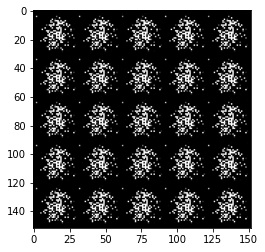

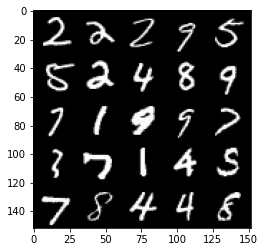

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 41


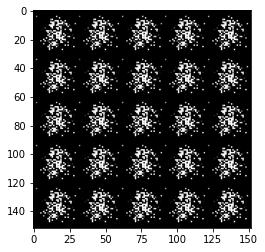

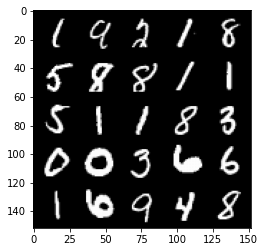

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 42


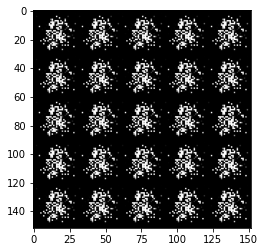

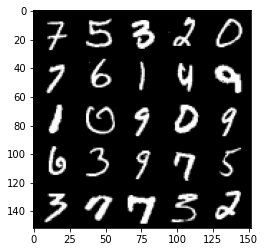

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 43


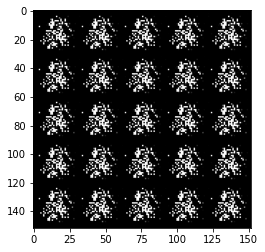

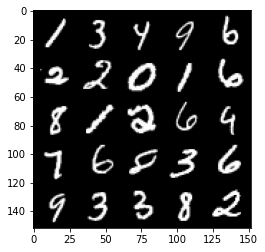

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 44


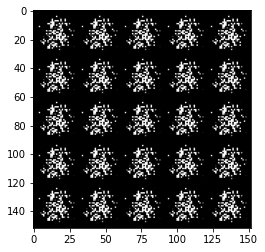

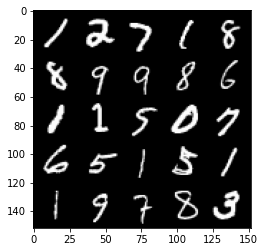

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 45


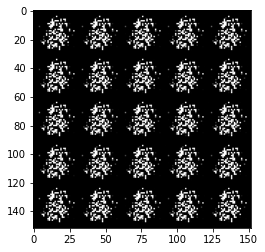

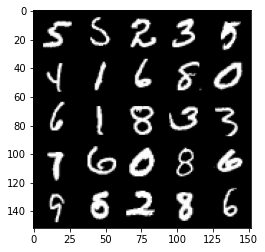

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 46


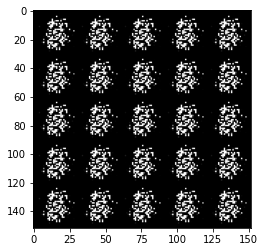

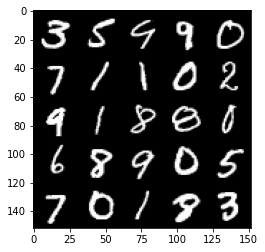

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 47


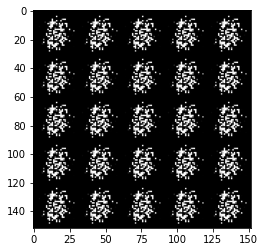

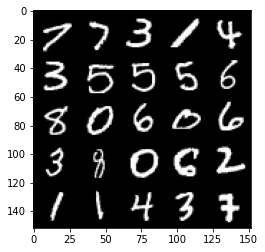

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 48


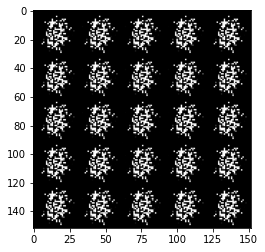

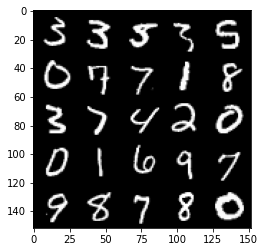

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 49


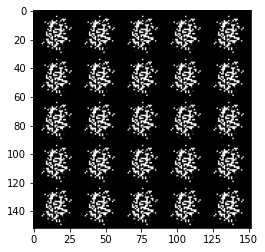

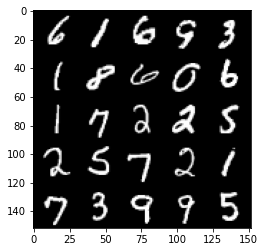

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 50


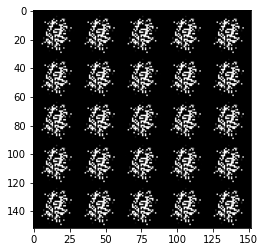

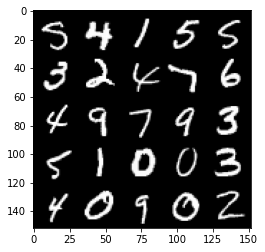

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 51


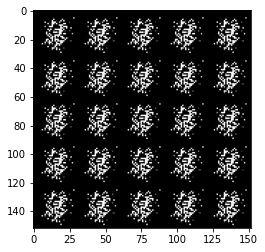

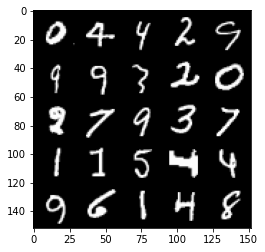

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 52


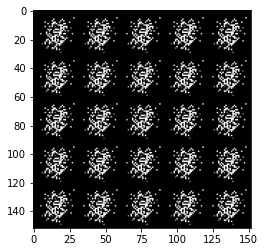

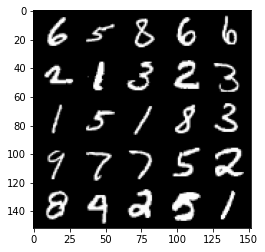

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 53


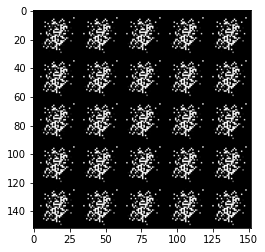

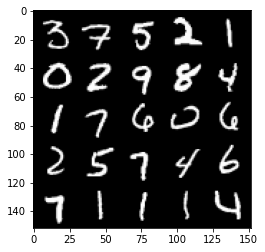

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 54


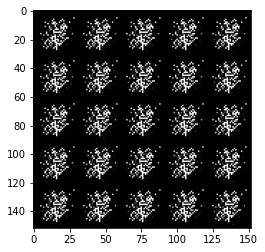

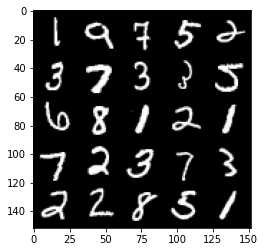

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 55


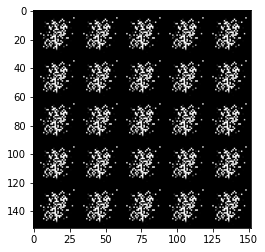

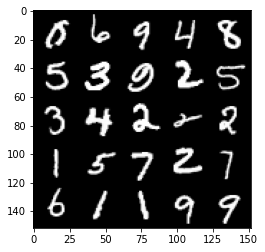

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 56


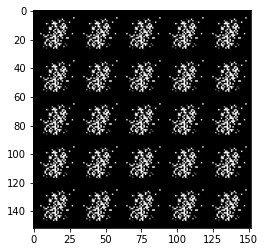

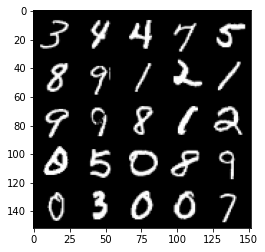

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 57


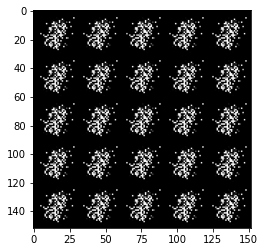

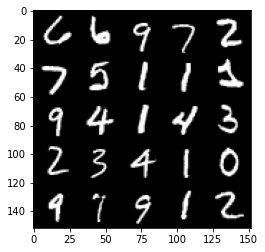

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 58


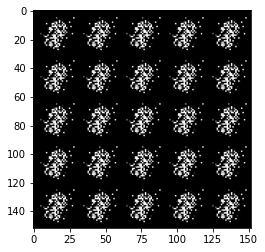

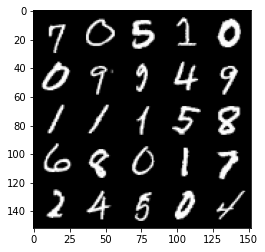

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 59


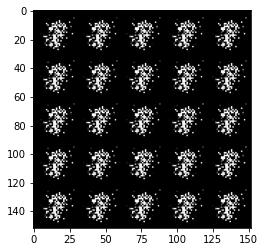

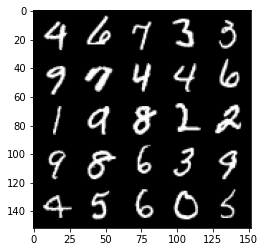

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 60


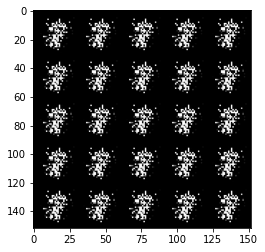

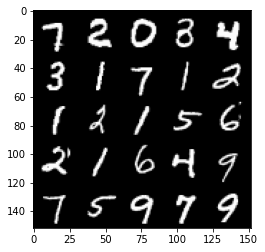

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 61


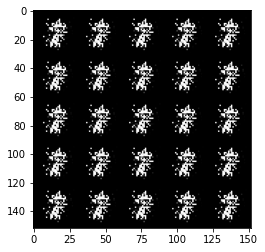

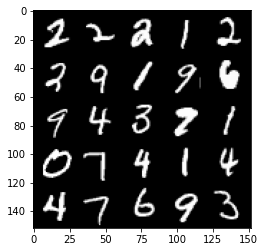

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 62


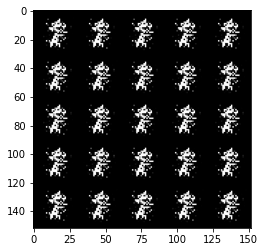

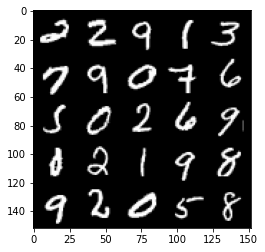

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 63


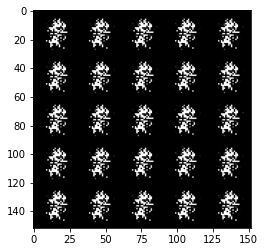

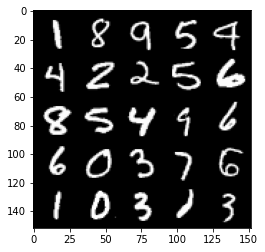

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 64


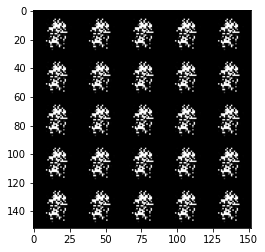

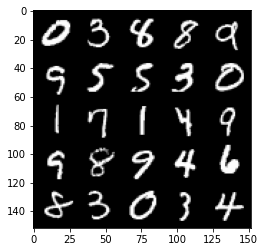

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 65


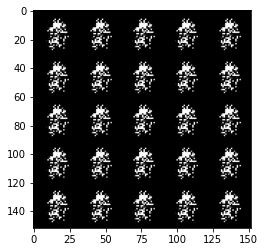

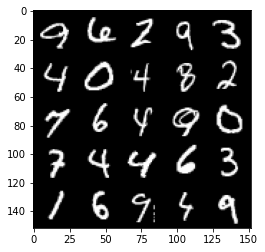

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 66


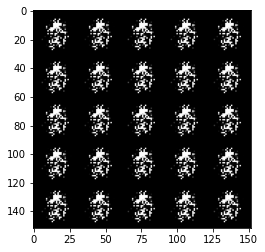

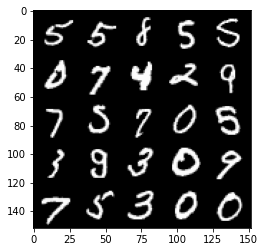

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 67


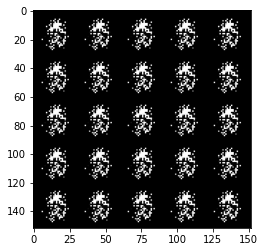

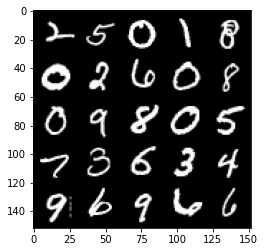

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 68


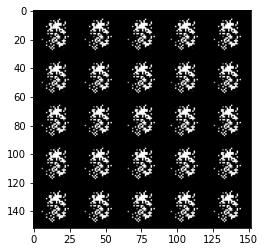

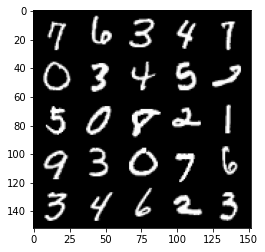

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 69


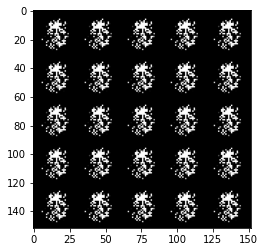

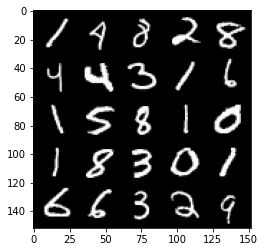

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 70


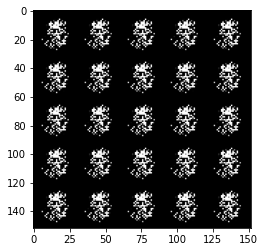

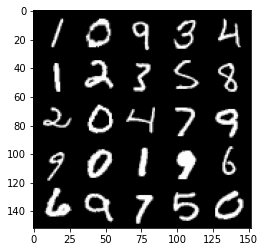

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 71


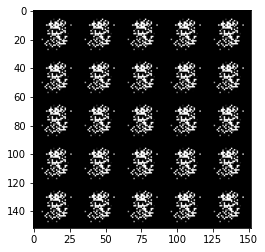

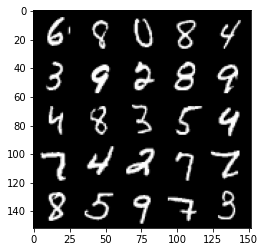

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 72


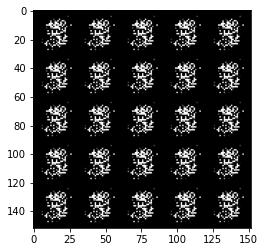

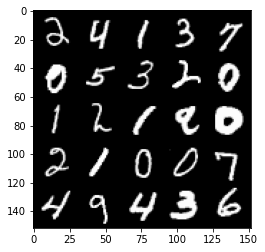

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 73


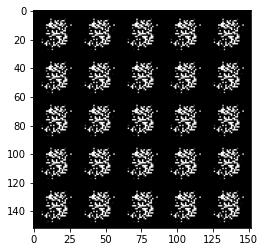

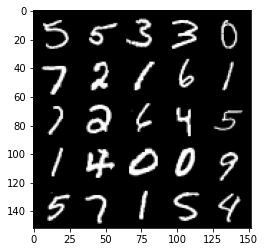

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 74


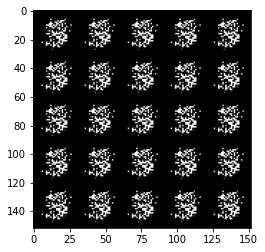

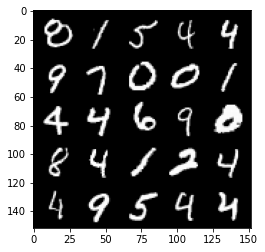

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 75


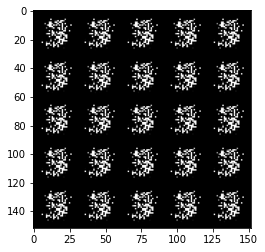

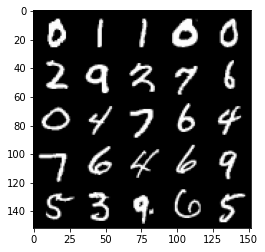

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 76


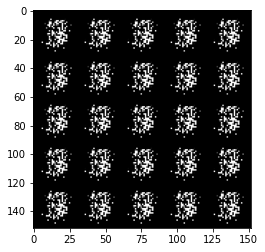

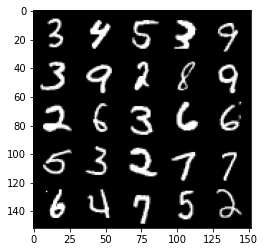

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 77


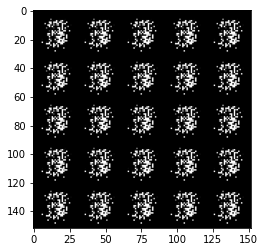

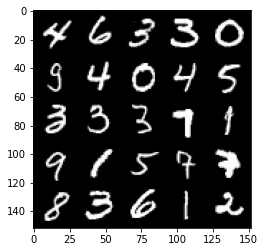

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 78


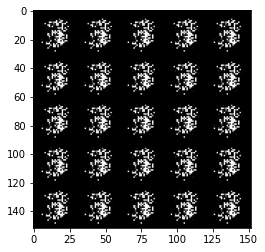

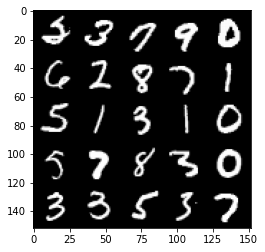

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 79


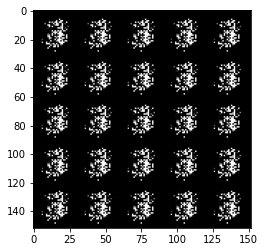

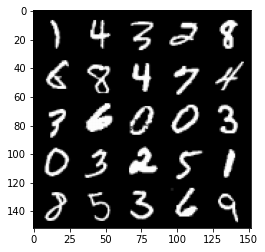

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 80


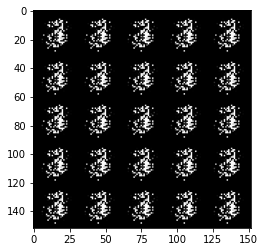

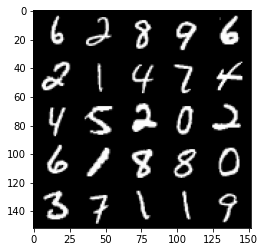

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 81


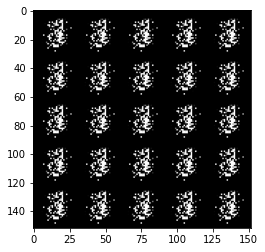

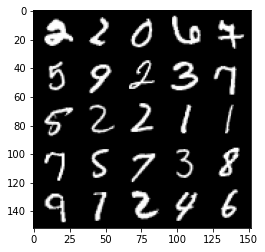

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 82


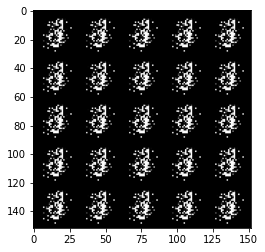

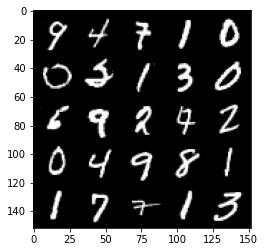

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 83


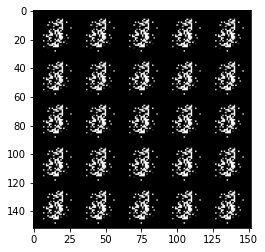

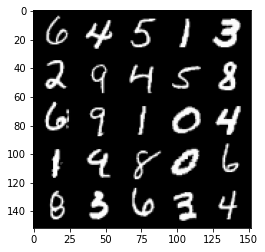

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 84


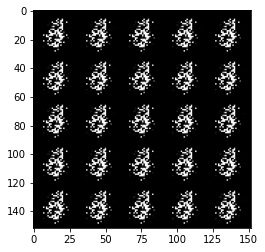

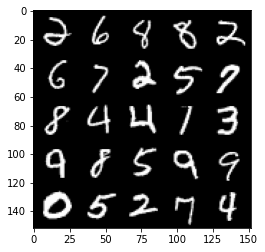

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 85


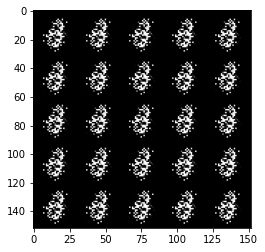

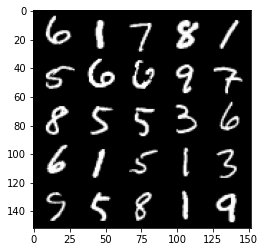

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 86


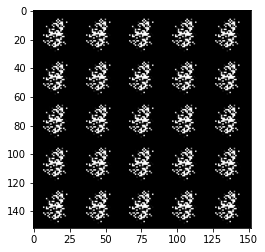

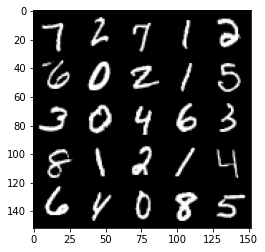

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 87


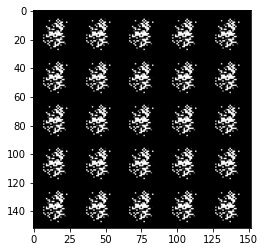

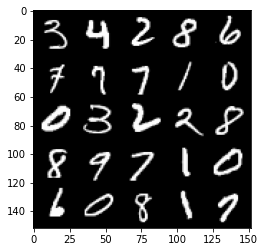

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 88


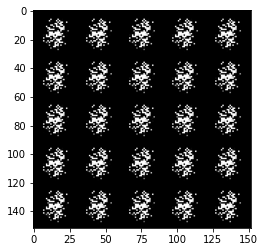

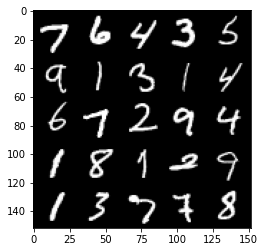

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 89


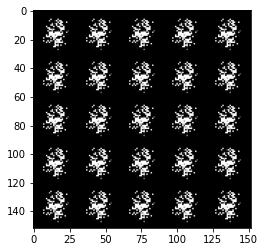

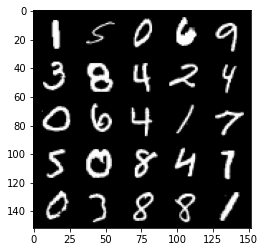

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 90


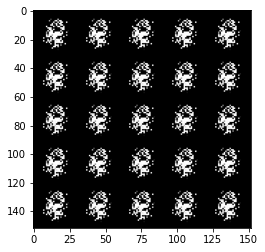

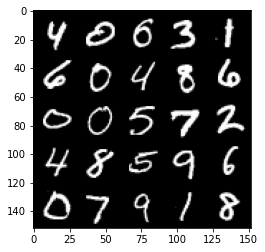

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 91


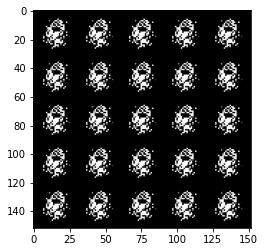

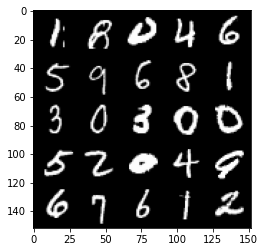

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 92


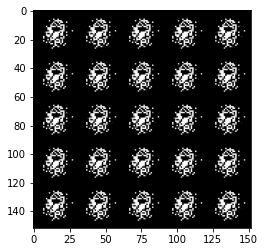

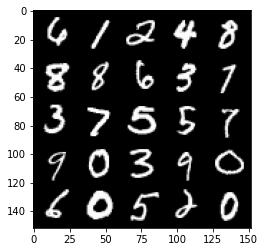

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 93


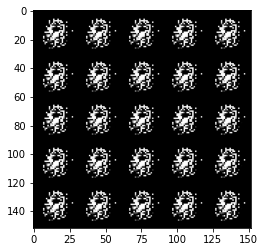

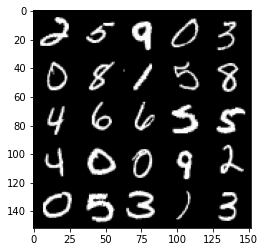

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 94


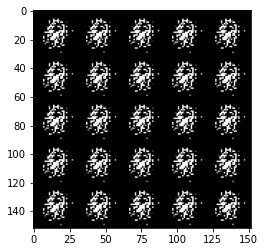

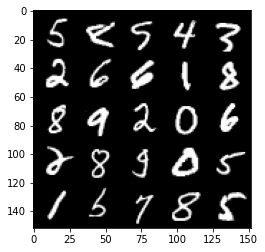

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 95


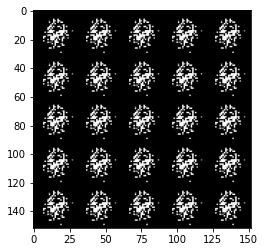

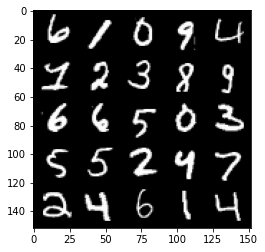

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 96


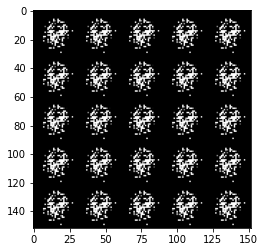

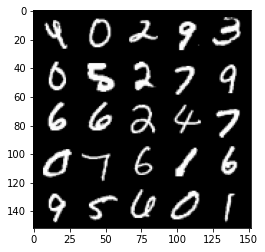

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 97


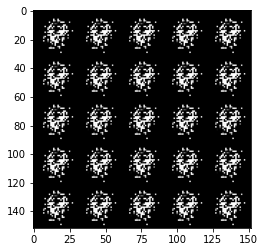

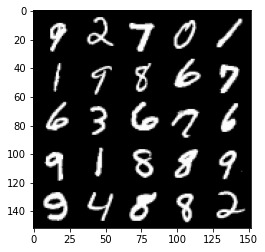

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 98


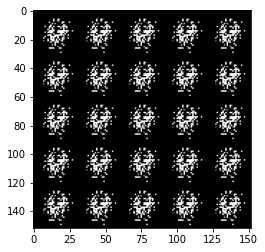

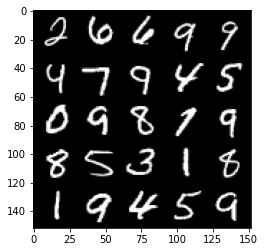

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 99


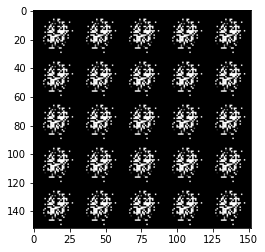

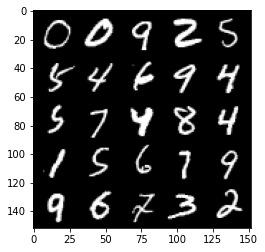

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 100


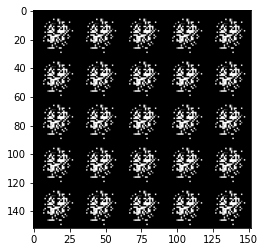

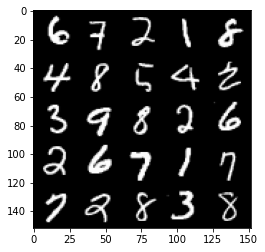

In [8]:
mean_generator_loss = 0
mean_discriminator_loss = 0
static_threshold = -1
DISCRIMINATOR = "discriminator"
GENERATOR = "generator"
to_train = "discriminator"
rel_batches = 0
disc_batches = 1
gen_batches = 1
train_string = ""
g_fpr = 0
d_R = 0
R_threshold = 0.7
push_threshold = 0.9
pull_threshold = 0.5
gen_loss = False
error = False
for epoch in range(n_epochs):
    # Dataloader returns the batches
    if epoch < static_threshold:
        for real, _ in tqdm(dataloader):
            cur_batch_size = len(real)
            # Flatten the batch of real images from the dataset
            real = real.view(cur_batch_size, -1).to(device)

            ### Update discriminator ###
            # Zero out the gradients before backpropagation
            disc_opt.zero_grad()
            # Calculate discriminator loss
            disc_loss = get_disc_loss(gen, disc, criterion, real, cur_batch_size, z_dim)
            # Update gradients
            disc_loss.backward(retain_graph=True)
        
            # Update optimizer
            disc_opt.step()

            if rel_batches >= disc_batches:
                rel_batches = 0
                for b in range(gen_batches):
                    gen_opt.zero_grad()
                    gen_loss = get_gen_loss(gen, disc, criterion, cur_batch_size, z_dim)
                    gen_loss.backward()
                    gen_opt.step()
            rel_batches = rel_batches + 1
    else:
        flag = True
        for real, _ in tqdm(dataloader):
            cur_batch_size = len(real)
            # Flatten the batch of real images from the dataset
            real = real.view(cur_batch_size, -1).to(device)
            
            if flag:
                stats = performance_stats(gen, disc, cur_batch_size, z_dim, real)
                g_fpr = stats[1]
                d_R = stats[0]
                training = "D"
                flag = False
            
            if training == "D" and g_fpr <= pull_threshold:
                #print("Dynamic Swap to G")
                training = "G"
            elif training == "G" and g_fpr >= push_threshold:
                #print("Dynamic Swap to D")
                training = "D"
                
            if training == "D":    
                ### Update discriminator ###
                # Zero out the gradients before backpropagation
                disc_opt.zero_grad()
                # Calculate discriminator loss
                disc_loss = get_disc_loss(gen, disc, criterion, real, cur_batch_size, z_dim)
                # Update gradients
                disc_loss.backward(retain_graph=True)
                # Update optimizer
                disc_opt.step()
                #print(f"D: fpR:{g_fpr:.{3}f}, Recall:{d_R:.{3}f},")
            if training == "G":
                gen_opt.zero_grad()
                gen_loss = get_gen_loss(gen, disc, criterion, cur_batch_size, z_dim)
                gen_loss.backward()
                gen_opt.step()
                #print(f"G: fpR:{g_fpr:.{3}f}, Recall:{d_R:.{3}f},")
                
            stats = performance_stats(gen, disc, cur_batch_size, z_dim, real)
            g_fpr = stats[1]
            d_R = stats[0]

    ### Visualization At End of Epoch ###
    print(f"Epoch {epoch + 1}")
    fake_noise = get_noise(cur_batch_size, z_dim)
    fake = gen(fake_noise)
    show_tensor_images(fake)
    show_tensor_images(real)
    mean_generator_loss = 0
    mean_discriminator_loss = 0